# Preprocessing
in this notebook we will present all the steps and all the different implementation we tried to prepare and preprocess the data to feed our models

### Imported libraries

In [5]:
# Models
import keras
import tensorflow
from keras.models import Sequential
from keras.layers import Dense

from tensorflow.keras import optimizers
from tensorflow.keras.metrics import F1Score
from tensorflow.keras.callbacks import EarlyStopping

# Downloads
import os
import requests

# Images and Data
from PIL import Image

#!pip install opencv-python
import cv2

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

import pickle


2024-04-28 12:01:55.461877: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


only run if using colab

In [1]:

#from google.colab import drive
#drive.flush_and_unmount()
#drive.mount("/content/drive")

### Paths to diferent directories
it's necessary to change the paths to the right directories where the files are saved

In [7]:
original_dataset_dir = "/Users/macbook/Documents/DL_Project/main_filepath"
dataset = "/Users/macbook/Documents/DL_Project/dataset_clean.csv"
imgs_path = "/Users/macbook/Documents/DL_Project/all_images"

we already did data preparation to our dataset so we can load the 'clean' version

In [8]:
dataset = pd.read_csv(dataset)


## Class imbalance

Plot a graph to display class imbalnace, with the counts of images for each class

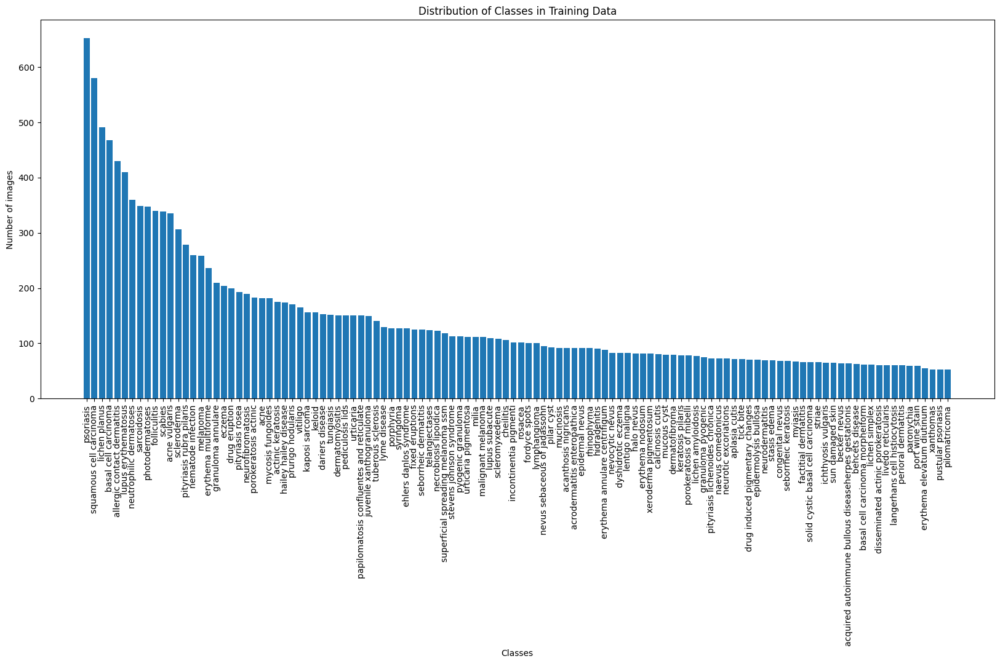

In [13]:
def plot_class_distribution(dir):
    class_counts = {}
    classes = os.listdir(dir)

    for class_name in classes:
        class_path = os.path.join(dir, class_name)
        
        if os.path.isdir(class_path):
            files = len(os.listdir(class_path))
            class_counts[class_name] = files

    sorted_class_counts = dict(sorted(class_counts.items(), key=lambda item: item[1], reverse=True))

    plt.figure(figsize=(20, 8))
    plt.bar(range(len(sorted_class_counts)), list(sorted_class_counts.values()), align='center')
    plt.xticks(range(len(sorted_class_counts)), list(sorted_class_counts.keys()), rotation='vertical')
    plt.xlabel('Classes')
    plt.ylabel('Number of images')
    plt.title('Distribution of Classes in Training Data')
    plt.show()

plot_class_distribution(original_dataset_dir)

## Preprocess algorithms
We focused on 3 and did different versions for each

### Dull Razor

V1

In [2]:
def dull_razorV1(image, lowbound=1, filterstruc=2, inpaintmat=1):
    if image.dtype != np.uint8:
        image = (image * 255).astype(np.uint8)

    img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (filterstruc, filterstruc))
    img_blackhat = cv2.morphologyEx(img_gray, cv2.MORPH_BLACKHAT, kernel)

    ret, mask = cv2.threshold(img_blackhat, lowbound, 255, cv2.THRESH_BINARY)
    img_final = cv2.inpaint(image, mask, inpaintmat, cv2.INPAINT_TELEA)

    return img_final




test on diferent images

In [15]:
image_paths = [
    "/Users/macbook/Documents/DL_Project/training/acanthosis nigricans/acanthosis_nigricans65.jpg",
    "/Users/macbook/Documents/DL_Project/training/seborrheic dermatitis/img imageId=6700.jpg",
    "/Users/macbook/Documents/DL_Project/training/dermatofibroma/dermatofibroma55.jpg"
]

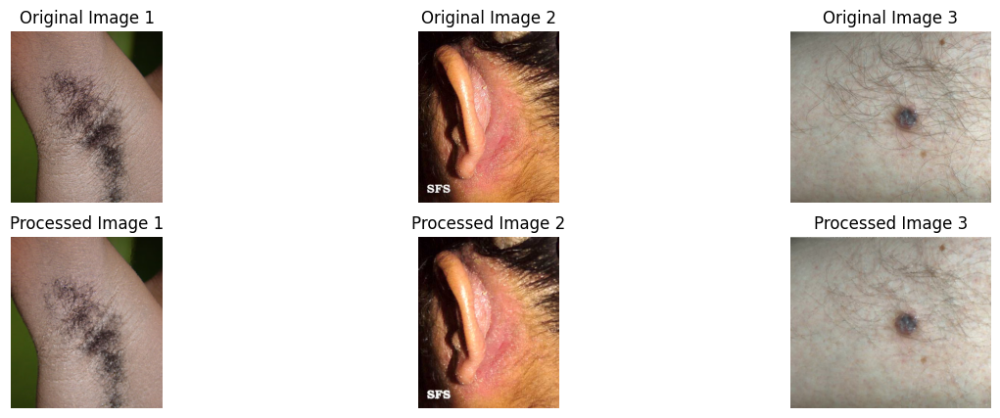

In [16]:
transformed_images = []
for path in image_paths:
    img_original = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
    img_transformed = dull_razorV1(img_original)
    transformed_images.append((img_original, img_transformed))
plt.figure(figsize=(15, 5))

for i, (img_original, img_transformed) in enumerate(transformed_images, start=1):
    plt.subplot(2, len(transformed_images), i)
    plt.imshow(img_original)
    plt.title(f'Original Image {i}')
    plt.axis('off')
    
    plt.subplot(2, len(transformed_images), len(transformed_images) + i)
    plt.imshow(img_transformed)
    plt.title(f'Processed Image {i}')
    plt.axis('off')

plt.show()


### Clahe

In [17]:
image_paths = [
    "/Users/macbook/Documents/DL_Project/training/fordyce spots/fordyce-spots10.jpg",
    "/Users/macbook/Documents/DL_Project/training/xanthomas/xanthomas15.jpg",
    "/Users/macbook/Documents/DL_Project/training/lyme disease/erythem_achronicum_migrans1.jpg"
]

V1

In [18]:
def claheV1(image):
    channels = cv2.split(image)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(7, 7))
    clahe_channels = [clahe.apply(cv2.convertScaleAbs(channel)) for channel in channels]
    enhanced_image = cv2.merge(clahe_channels)

    return enhanced_image



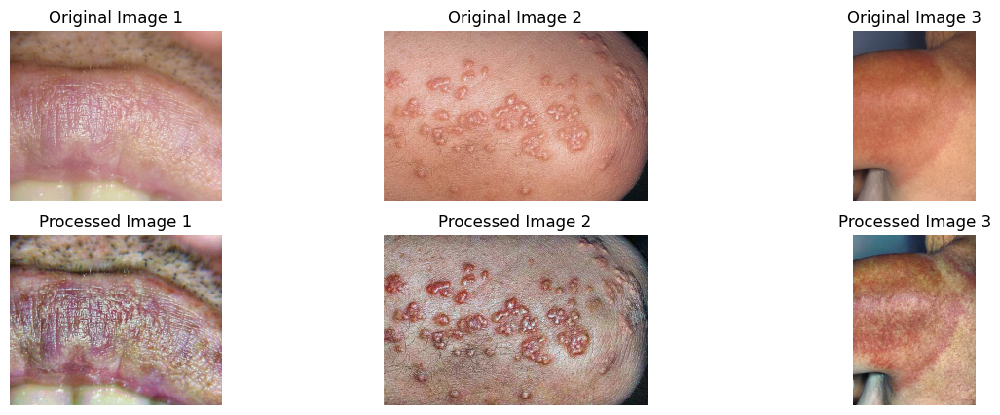

In [19]:
transformed_images = []
for path in image_paths:
    img_original = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
    img_transformed = claheV1(img_original)
    transformed_images.append((img_original, img_transformed))
plt.figure(figsize=(15, 5))

for i, (img_original, img_transformed) in enumerate(transformed_images, start=1):
    plt.subplot(2, len(transformed_images), i)
    plt.imshow(img_original)
    plt.title(f'Original Image {i}')
    plt.axis('off')
    
    plt.subplot(2, len(transformed_images), len(transformed_images) + i)
    plt.imshow(img_transformed)
    plt.title(f'Processed Image {i}')
    plt.axis('off')

plt.show()

V2

In [20]:
def claheV2(image):
    if len(image.shape) == 3 and image.shape[2] == 3:
        lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
        l_channel, a_channel, b_channel = cv2.split(lab)
        
        clahe = cv2.createCLAHE(clipLimit=3)
        l_clahe = clahe.apply(l_channel)

        lab = cv2.merge((l_clahe, a_channel, b_channel))

        enhanced_image_rgb = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)

        return enhanced_image_rgb
    else:
        raise ValueError("Unsupported Format")


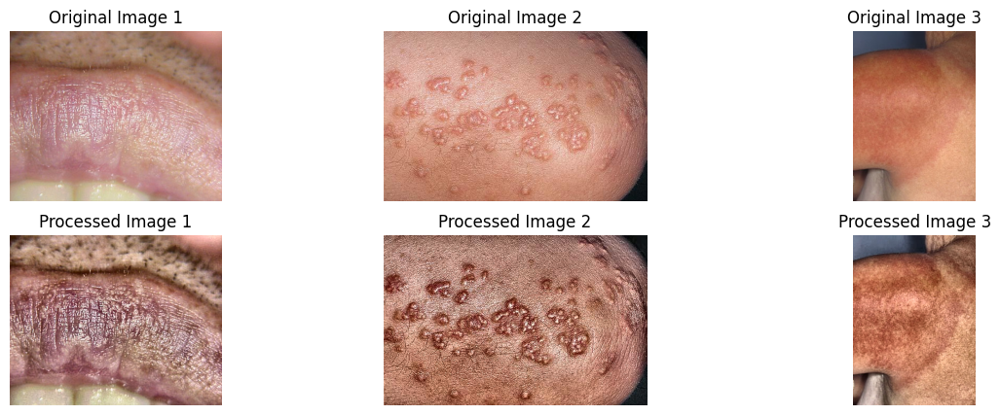

In [21]:
transformed_images = []
for path in image_paths:
    img_original = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
    img_transformed = claheV2(img_original)
    transformed_images.append((img_original, img_transformed))
plt.figure(figsize=(15, 5))

for i, (img_original, img_transformed) in enumerate(transformed_images, start=1):
    plt.subplot(2, len(transformed_images), i)
    plt.imshow(img_original)
    plt.title(f'Original Image {i}')
    plt.axis('off')
    
    plt.subplot(2, len(transformed_images), len(transformed_images) + i)
    plt.imshow(img_transformed)
    plt.title(f'Processed Image {i}')
    plt.axis('off')

plt.show()

V3

In [22]:

def claheV3(image):
    if len(image.shape) == 3 and image.shape[2] == 3:
        lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
        
        l_channel, a_channel, b_channel = cv2.split(lab)
        
        if l_channel.dtype != np.uint8:
            l_channel = cv2.convertScaleAbs(l_channel)

        clahe = cv2.createCLAHE(clipLimit=5)
        cl_channel = clahe.apply(l_channel)
        
        a_channel_resized = cv2.resize(a_channel, (cl_channel.shape[1], cl_channel.shape[0]), interpolation=cv2.INTER_NEAREST)
        b_channel_resized = cv2.resize(b_channel, (cl_channel.shape[1], cl_channel.shape[0]), interpolation=cv2.INTER_NEAREST)

        cl_channel = cv2.convertScaleAbs(cl_channel)
        a_channel_resized = cv2.convertScaleAbs(a_channel_resized)
        b_channel_resized = cv2.convertScaleAbs(b_channel_resized)

        enhanced_lab = cv2.merge((cl_channel, a_channel_resized, b_channel_resized))
        enhanced_image_rgb = cv2.cvtColor(enhanced_lab, cv2.COLOR_LAB2RGB)

        return enhanced_image_rgb
    else:
        raise ValueError("Unsupported Format")


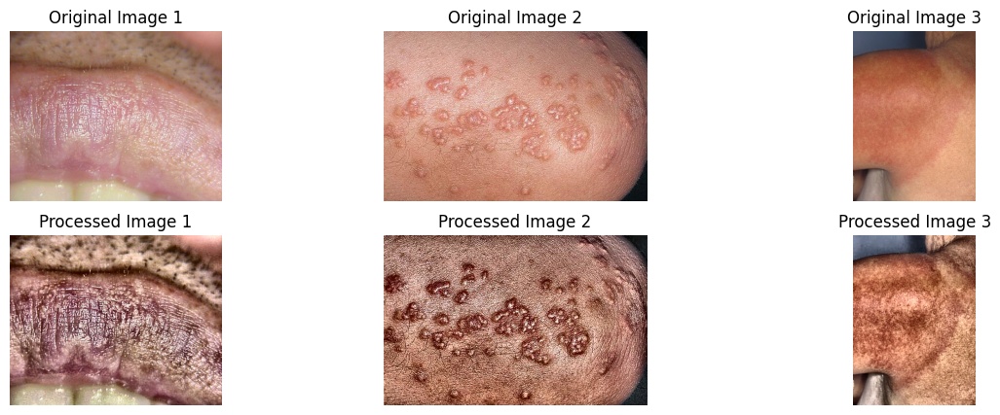

In [23]:
transformed_images = []
for path in image_paths:
    img_original = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
    img_transformed = claheV3(img_original)
    transformed_images.append((img_original, img_transformed))
plt.figure(figsize=(15, 5))

for i, (img_original, img_transformed) in enumerate(transformed_images, start=1):
    plt.subplot(2, len(transformed_images), i)
    plt.imshow(img_original)
    plt.title(f'Original Image {i}')
    plt.axis('off')
    
    plt.subplot(2, len(transformed_images), len(transformed_images) + i)
    plt.imshow(img_transformed)
    plt.title(f'Processed Image {i}')
    plt.axis('off')

plt.show()

V4

In [24]:
def claheV4(image):
    if len(image.shape) == 3 and image.shape[2] == 3:
        lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
        l_channel, a_channel, b_channel = cv2.split(lab)
        
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(1, 1))
        l_channel_clahe = clahe.apply(l_channel)
        
        lab = cv2.merge((l_channel_clahe, a_channel, b_channel))
        
        enhanced_image_rgb = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)
        
        return enhanced_image_rgb
    else:
        raise ValueError("Unsupported Format")

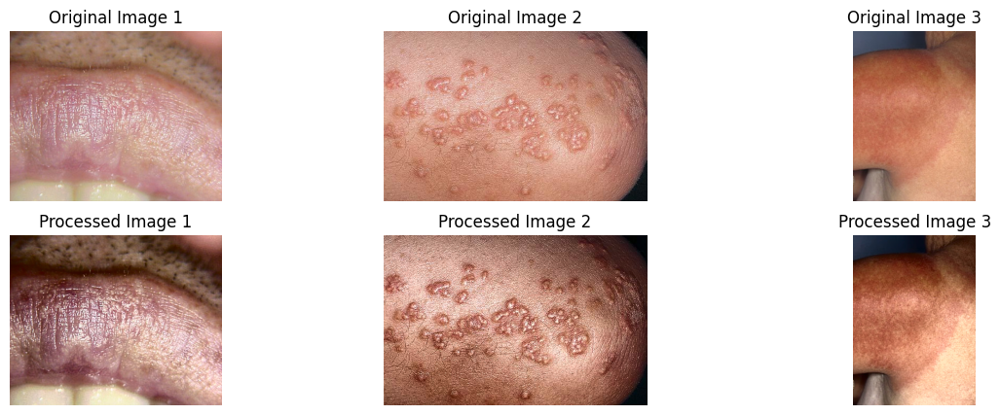

In [25]:
transformed_images = []
for path in image_paths:
    img_original = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
    img_transformed = claheV4(img_original)
    transformed_images.append((img_original, img_transformed))
plt.figure(figsize=(15, 5))

for i, (img_original, img_transformed) in enumerate(transformed_images, start=1):
    plt.subplot(2, len(transformed_images), i)
    plt.imshow(img_original)
    plt.title(f'Original Image {i}')
    plt.axis('off')
    
    plt.subplot(2, len(transformed_images), len(transformed_images) + i)
    plt.imshow(img_transformed)
    plt.title(f'Processed Image {i}')
    plt.axis('off')

plt.show()

### Medium Blur

In [26]:
def median_blurV1(image, kernel_size=5):
    return cv2.medianBlur(image, kernel_size)

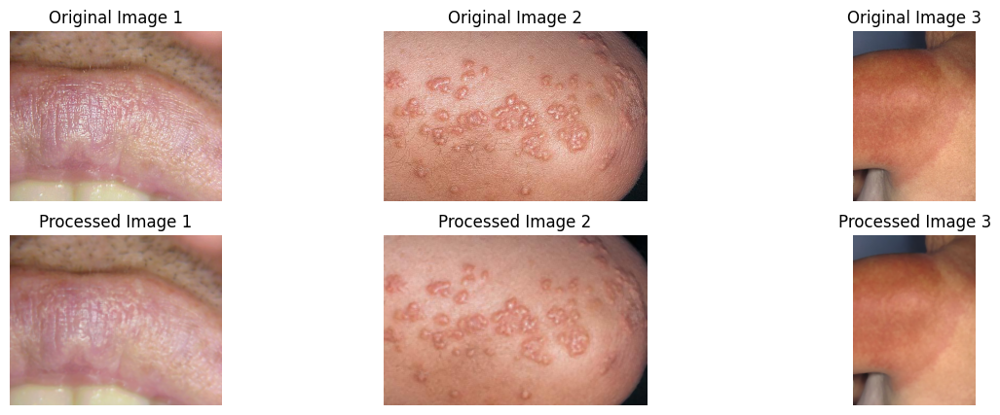

In [27]:
transformed_images = []
for path in image_paths:
    img_original = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
    img_transformed = median_blurV1(img_original)
    transformed_images.append((img_original, img_transformed))
plt.figure(figsize=(15, 5))

for i, (img_original, img_transformed) in enumerate(transformed_images, start=1):
    plt.subplot(2, len(transformed_images), i)
    plt.imshow(img_original)
    plt.title(f'Original Image {i}')
    plt.axis('off')
    
    plt.subplot(2, len(transformed_images), len(transformed_images) + i)
    plt.imshow(img_transformed)
    plt.title(f'Processed Image {i}')
    plt.axis('off')

plt.show()

## Apply transformations to directories

diferent combinations with the preprocessing algorithms

In [ ]:
def image_preprocessing1(img):
    img = dull_razorV1(img)
    img = claheV1(img)
    return img

def image_preprocessing2(img):
    img = claheV1(img)
    img = median_blurV1(img)
    return img

testing the combinations

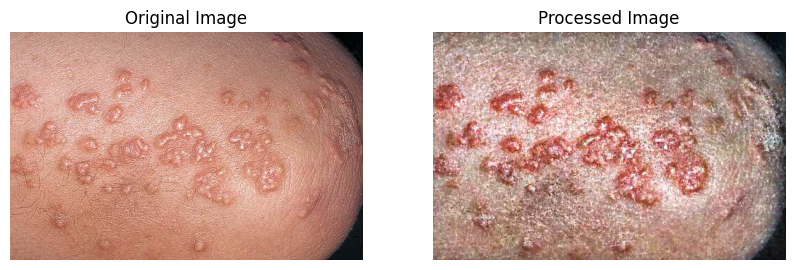

In [28]:
img = cv2.cvtColor(cv2.imread('/Users/macbook/Documents/DL_Project/training/xanthomas/xanthomas15.jpg'), cv2.COLOR_BGR2RGB)
img_processed = image_preprocessing1(img)

plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(img), plt.title('Original Image')
plt.axis('off')
plt.subplot(122), plt.imshow(img_processed), plt.title('Processed Image')
plt.axis('off')
plt.show()


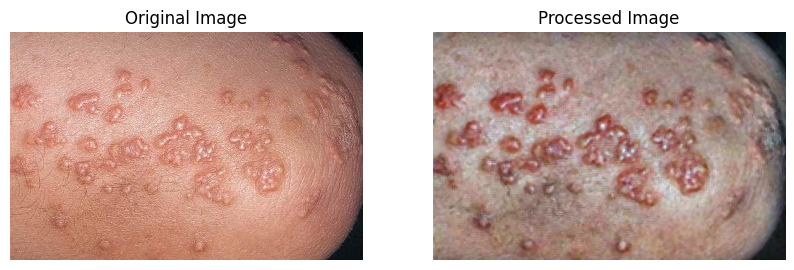

In [29]:
img_processed = image_preprocessing2(img)

plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(img), plt.title('Original Image')
plt.axis('off')
plt.subplot(122), plt.imshow(img_processed), plt.title('Processed Image')
plt.axis('off')
plt.show()

We need to save the transformed images so it's necessarie to give an output path for each set

In [ ]:
output_val_dir = ""
output_test_dir = ""
output_train_dir = ""

the following functions open the images from the train, val and test directories, applys the provided image preprocess algorithms and saves the transformed image to the output directories

In [4]:
def process_images(input_directory, output_directory):
    for root, dirs, files in os.walk(input_directory):
        for subdir in dirs:
            input_subdirectory = os.path.join(root, subdir)
            output_subdirectory = os.path.join(output_directory, subdir)

            if not os.path.exists(output_subdirectory):
                os.makedirs(output_subdirectory)

            for filename in os.listdir(input_subdirectory):
                if filename.endswith((".jpg", ".png")):
                    image_path = os.path.join(input_subdirectory, filename)
                    image = cv2.imread(image_path)

                    filtered_image = image_preprocessing1(image)

                    output_path = os.path.join(output_subdirectory, filename)
                    cv2.imwrite(output_path, filtered_image)

output_val_dir = "/Users/macbook/Documents/DL_Project/preprocess_images/preprocessing1/output_val_dir"
output_test_dir = "/Users/macbook/Documents/DL_Project/preprocess_images/preprocessing1/output_test_dir"
output_train_dir = "/Users/macbook/Documents/DL_Project/preprocess_images/preprocessing1/output_train_dir"

process_images(val_dir, output_val_dir)
process_images(test_dir, output_test_dir)
process_images(train_dir, output_train_dir)

In [32]:
def process_images(input_directory, output_directory):
    for root, dirs, files in os.walk(input_directory):
        for subdir in dirs:
            input_subdirectory = os.path.join(root, subdir)
            output_subdirectory = os.path.join(output_directory, subdir)

            if not os.path.exists(output_subdirectory):
                os.makedirs(output_subdirectory)

            for filename in os.listdir(input_subdirectory):
                if filename.endswith((".jpg", ".png")):
                    image_path = os.path.join(input_subdirectory, filename)
                    image = cv2.imread(image_path)

                    filtered_image = image_preprocessing2(image)

                    # Save the filtered image to the output directory
                    output_path = os.path.join(output_subdirectory, filename)
                    cv2.imwrite(output_path, filtered_image)

output_val_dir = "/Users/macbook/Documents/DL_Project/preprocess_images/preprocess2/output_val_dir"
output_test_dir = "/Users/macbook/Documents/DL_Project/preprocess_images/preprocess2/output_test_dir"
output_train_dir = "/Users/macbook/Documents/DL_Project/preprocess_images/preprocess2/output_train_dir"

process_images(val_dir, output_val_dir)
process_images(test_dir, output_test_dir)
process_images(train_dir, output_train_dir)

In [33]:
def process_images(input_directory, output_directory):
    for root, dirs, files in os.walk(input_directory):
        for subdir in dirs:
            input_subdirectory = os.path.join(root, subdir)
            output_subdirectory = os.path.join(output_directory, subdir)

            if not os.path.exists(output_subdirectory):
                os.makedirs(output_subdirectory)

            for filename in os.listdir(input_subdirectory):
                if filename.endswith((".jpg", ".png")):
                    image_path = os.path.join(input_subdirectory, filename)
                    image = cv2.imread(image_path)

                    filtered_image = claheV1(image)

                    # Save the filtered image to the output directory
                    output_path = os.path.join(output_subdirectory, filename)
                    cv2.imwrite(output_path, filtered_image)

output_val_dir = "/Users/macbook/Documents/DL_Project/preprocess_images/ClaheV1/output_val_dir"
output_test_dir = "/Users/macbook/Documents/DL_Project/preprocess_images/ClaheV1/output_test_dir"
output_train_dir = "/Users/macbook/Documents/DL_Project/preprocess_images/ClaheV1/output_train_dir"

process_images(val_dir, output_val_dir)
process_images(test_dir, output_test_dir)
process_images(train_dir, output_train_dir)

In [34]:
def process_images(input_directory, output_directory):
    for root, dirs, files in os.walk(input_directory):
        for subdir in dirs:
            input_subdirectory = os.path.join(root, subdir)
            output_subdirectory = os.path.join(output_directory, subdir)

            if not os.path.exists(output_subdirectory):
                os.makedirs(output_subdirectory)

            for filename in os.listdir(input_subdirectory):
                if filename.endswith((".jpg", ".png")):
                    image_path = os.path.join(input_subdirectory, filename)
                    image = cv2.imread(image_path)

                    filtered_image = claheV3(image)

                    # Save the filtered image to the output directory
                    output_path = os.path.join(output_subdirectory, filename)
                    cv2.imwrite(output_path, filtered_image)

output_val_dir = "/Users/macbook/Documents/DL_Project/preprocess_images/ClaheV3/output_val_dir"
output_test_dir = "/Users/macbook/Documents/DL_Project/preprocess_images/ClaheV3/output_test_dir"
output_train_dir = "/Users/macbook/Documents/DL_Project/preprocess_images/ClaheV3/output_train_dir"

process_images(val_dir, output_val_dir)
process_images(test_dir, output_test_dir)
process_images(train_dir, output_train_dir)

## Transform images to arrays

fuction to extract filenames from images to be able to save the path of each image to save it in the dataset

In [ ]:
def get_filename(url):
    filename = url.split("/")[-1]
    filename = filename.replace("?", "_")
    if not filename.endswith(".jpg"):
        filename += ".jpg"
    return filename

def create_paths(filename):
    return os.path.join(imgs_path, filename)

dataset['filename'] = dataset['url'].apply(get_filename)

dataset['image_path'] = dataset['filename'].apply(create_paths)



funtion to transform images into arrays and save them in the dataset

In [ ]:
def load_image_as_array(image_path, target_size=(300, 300)):
    try:
        img = Image.open(image_path)
        img = img.resize(target_size)
        img_array = np.array(img)
        return img_array
    except Exception as e:
        print(f"Error loading image: {e}")
        return None

target_size = (300, 300)
dataset['image_array_sq'] = dataset['image_path'].apply(lambda x: load_image_as_array(x, target_size))


take out 'wrong' values 
- first check the number of rows and identified that we have more rows than images saved on all_images directory
- delete the rows where we don't have arrays to correct this issue

In [ ]:
num_rows = len(dataset)
print("Number of rows:", num_rows)

Number of rows: 16519


In [ ]:
dataset = dataset.dropna(subset=['image_array_sq'])
num_rows = len(dataset)
print("Number of rows:", num_rows)

Number of rows: 16509


We found some images that were not converting well was because they were black and white, after inspection we decided to drop them. The function bellow looks for images that are on RGB format, so that we can exclude images that are not in that format.

In [ ]:
def is_rgb(img_array):
    # Check the number of dimensions, grayscale should have 2 dimensions or third dimension as 1
    if img_array.ndim == 3 and img_array.shape[2] == 3:
        return True
    return False

# Filter the dataset in place to keep only RGB images
dataset = dataset[dataset['image_array_sq'].apply(is_rgb)]

check if everything looks fine

In [ ]:
new_dataset = dataset.copy()

In [8]:
new_dataset.head(1)

,md5hash,fitzpatrick_scale,fitzpatrick_centaur,label,nine_partition_label,three_partition_label,qc,url,url_alphanum,filename,image_path,image_array_sq,is_grayscale
0,5e82a45bc5d78bd24ae9202d194423f8,3,3,drug induced pigmentary changes,inflammatory,non-neoplastic,NaN,https://www.dermaamin.com/site/images/clinical...,httpwwwdermaamincomsiteimagesclinicalpicmminoc...,minocycline-pigmentation1.jpg,C:\Users\afspf\Documents\FAC\2nd semester\DL\P...,"[[[169, 180, 190], [171, 181, 193], [174, 182,...",False


Last step was to extract the dataset with the knew columns created so that it could be used by everyone

In [ ]:
path = r'C:\Users\afspf\Documents\FAC\2nd semester\DL\Project'
filename = 'new_dataset_arrays.pkl'

if not os.path.exists(path):
    os.makedirs(path)


with open(os.path.join(path, filename), 'wb') as file:
    pickle.dump(new_dataset, file)

## Data augmentation

### Yolo to crop images

function to build Yolo 
- implementation was based on @article{yolov3,
  title={YOLOv3: An Incremental Improvement},
  author={Redmon, Joseph and Farhadi, Ali},
  journal = {arXiv},
  year={2018}
}
- to work on Yolo we need to have yolov3.weights, yolov3.cfg, coco.names from github repository https://github.com/pjreddie/darknet/tree/master


read and open necessary files

In [ ]:
net = cv2.dnn.readNet("Yolo_files/yolov3.weights", "Yolo_files/yolov3.cfg")
classes = []
with open("Yolo_files/coco.names", "r") as f:
    classes = [line.strip() for line in f.readlines()]

function to dectect objects

In [ ]:
def yolo(image):
    height, width, _ = image.shape
    blob = cv2.dnn.blobFromImage(image, 1/255.0, (416, 416), swapRB=True, crop=False)
    net.setInput(blob)
    layer_names = net.getLayerNames()
    output_layers_indices = net.getUnconnectedOutLayers()
    output_layers = [layer_names[i - 1] for i in output_layers_indices]
    outputs = net.forward(output_layers)

    boxes = []
    confidences = []
    class_ids = []

    for output in outputs:
        for detection in output:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.5:
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)
                x = int(center_x - w / 2)
                y = int(center_y - h / 2)
                boxes.append([x, y, w, h])
                confidences.append(float(confidence))
                class_ids.append(class_id)

    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)
    detected_objects = []
    for i in range(len(boxes)):
        if i in indexes:
            x, y, w, h = boxes[i]
            label = str(classes[class_ids[i]])
            detected_objects.append((label, (x, y, x+w, y+h)))
            cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)
            cv2.putText(image, label, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    
    return image, detected_objects



function to crop images based on yolo results

In [ ]:
def crop_objects(image, detected_objects):
    cropped_images = []
    for _, (x1, y1, x2, y2) in detected_objects:
        cropped_images.append(image[y1:y2, x1:x2])
    return cropped_images

testing different images

In [ ]:
image = cv2.imread("/Users/macbook/Documents/DL_Project/training/xanthomas/xanthomas21.jpg")
detected_image, detected_objects = yolo(image)

cropped_images = crop_objects(image, detected_objects)

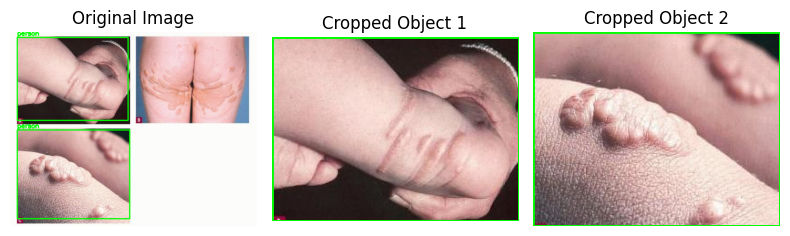

In [ ]:
plt.figure(figsize=(8, 6))
plt.subplot(2, len(cropped_images) + 1, 1)  
plt.imshow(cv2.cvtColor(detected_image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis('off')

for i, cropped_image in enumerate(cropped_images):
    plt.subplot(2, len(cropped_images) + 1, i + 2)  
    plt.imshow(cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB))
    plt.title(f"Cropped Object {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
image = cv2.imread("/Users/macbook/Documents/DL_Project/main_filepath/sun damaged skin/sun-burn7.jpg")
detected_image, detected_objects = yolo(image)

cropped_images = crop_objects(image, detected_objects)

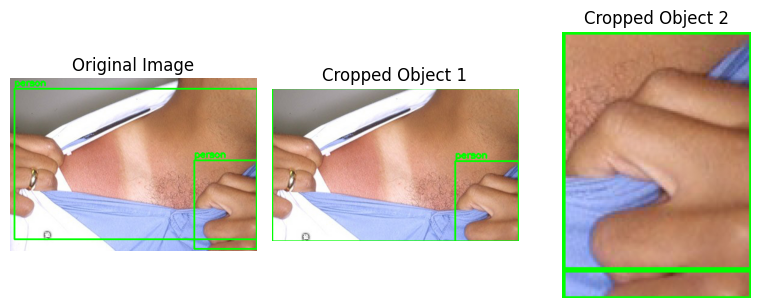

In [ ]:
plt.figure(figsize=(8, 6))
plt.subplot(2, len(cropped_images) + 1, 1)  
plt.imshow(cv2.cvtColor(detected_image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis('off')

for i, cropped_image in enumerate(cropped_images):
    plt.subplot(2, len(cropped_images) + 1, i + 2)  
    plt.imshow(cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB))
    plt.title(f"Cropped Object {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()



We build an extra function that looks on a specific directory and applys yolo and cropping while saving the cropped images
- we needed to had an if statement to only crop images with more them one object detected cause there were beging save duplicated images when yolo only found 1 object.
- the fuction makes a copy of the image. then check with it was more than one object, it also checks if the cropped image is valid to finally save the cropped images on a new directory to futher analisis.

In [ ]:
def process_images_in_directory(directory):
    output_directory = os.path.join(directory, "cropped_images")
    os.makedirs(output_directory, exist_ok=True)
    for filename in os.listdir(directory):
        if filename.endswith(".jpg") or filename.endswith(".png"):
            filepath = os.path.join(directory, filename)
            image = cv2.imread(filepath)
            if image is None:
                print(f"Unable to read image: {filepath}")
                continue
            original_image = image.copy()  
            detected_image, detected_objects = yolo(image)
            if len(detected_objects) > 1:
                cropped_images = crop_objects(original_image, detected_objects)
                for i, cropped_image in enumerate(cropped_images):
                    if cropped_image is not None and cropped_image.size > 0: 
                        output_filename = f"{filename.split('.')[0]}_{i}.jpg"
                        output_filepath = os.path.join(output_directory, output_filename)
                        cv2.imwrite(output_filepath, cropped_image)
                        print(f"Object cropped from {filename} saved as {output_filename}")
                    else:
                        print(f"Invalid cropped image from {filename}, skipping...")
            else:
                print(f"YOLO detected less than 2 objects in {filename}, skipping cropping")

In [ ]:
image_directory = "/Users/macbook/Documents/DL_Project/main_filepath/xanthomas"
process_images_in_directory(image_directory)

Object cropped from xanthomas3.jpg saved as xanthomas3_0.jpg
Object cropped from xanthomas3.jpg saved as xanthomas3_1.jpg
YOLO detected less than 2 objects in xanthomas11.jpg, skipping cropping
YOLO detected less than 2 objects in xanthomas10.jpg, skipping cropping
YOLO detected less than 2 objects in xanthomas2.jpg, skipping cropping
YOLO detected less than 2 objects in xanthomas12.jpg, skipping cropping
YOLO detected less than 2 objects in xanthomas13.jpg, skipping cropping
YOLO detected less than 2 objects in xanthomas1.jpg, skipping cropping
YOLO detected less than 2 objects in xanthomas5.jpg, skipping cropping
YOLO detected less than 2 objects in xanthomas17.jpg, skipping cropping
YOLO detected less than 2 objects in xanthomas16.jpg, skipping cropping
YOLO detected less than 2 objects in xanthomas4.jpg, skipping cropping
YOLO detected less than 2 objects in anthrax19.jpg, skipping cropping
YOLO detected less than 2 objects in anthrax8.jpg, skipping cropping
YOLO detected less than

In [ ]:
image_directory = "/Users/macbook/Documents/DL_Project/main_filepath/sun damaged skin"
process_images_in_directory(image_directory)

YOLO detected less than 2 objects in electric_burn2.jpg, skipping cropping
YOLO detected less than 2 objects in electric_burn1.jpg, skipping cropping
YOLO detected less than 2 objects in acute_sunburn1.jpg, skipping cropping
Object cropped from burn_depth_classificatin1.jpg saved as burn_depth_classificatin1_0.jpg
Object cropped from burn_depth_classificatin1.jpg saved as burn_depth_classificatin1_1.jpg
YOLO detected less than 2 objects in acute_sunburn3.jpg, skipping cropping
YOLO detected less than 2 objects in sun-damaged-skin8.jpg, skipping cropping
YOLO detected less than 2 objects in sun-damaged-skin9.jpg, skipping cropping
YOLO detected less than 2 objects in acute_sunburn2.jpg, skipping cropping
YOLO detected less than 2 objects in sun-burn35.jpg, skipping cropping
YOLO detected less than 2 objects in sun-burn21.jpg, skipping cropping
YOLO detected less than 2 objects in fluoride_burn2.jpg, skipping cropping
YOLO detected less than 2 objects in sun-burn8.jpg, skipping cropping


seeing how images where cropped we found to be making several mistakes and decided to drop this idea and don't implement on any models.

### Similarity between images
Look for image similarities pq?

First we build a fuction to calculate chi_square distances, and another to open images on dir and calculate this distances. The bigger the result the closest images will be

In [1]:

def compute_histogram_similarity(hist1, hist2):
    return cv2.compareHist(hist1, hist2, cv2.HISTCMP_CHISQR)


def compute_image_histograms(image_dir):
    image_histograms = {}
    for filename in os.listdir(image_dir):
        if filename.endswith(".jpg") or filename.endswith(".png"):
            filepath = os.path.join(image_dir, filename)
            img = cv2.imread(filepath)
            hist = cv2.calcHist([img], [0, 1, 2], None, [8, 8, 8], [0, 256, 0, 256, 0, 256])
            hist = cv2.normalize(hist, hist).flatten()
            image_histograms[filename] = (img, hist)
    return image_histograms

another fuction to find the pairs where distance is between a given threshold to spot similar images

In [2]:
def find_similar_images(image_dir, threshold=0.1):
    image_histograms = compute_image_histograms(image_dir)
    similar_images = []
    for filename1, (img1, hist1) in image_histograms.items():
        for filename2, (img2, hist2) in image_histograms.items():
            if filename1 != filename2:
                similarity = compute_histogram_similarity(hist1, hist2)
                if similarity < threshold:
                    similar_images.append((filename1, img1, filename2, img2, similarity))
    if not similar_images:
        print("No similar images found in the directory.")
    return similar_images

finally one last function to display the pairs that are similar

In [3]:
def display_similar_images(similar_images):
    for pair in similar_images:
        filename1, img1, filename2, img2, similarity = pair
        print(f"Similarity between {filename1} and {filename2}: {similarity}")
        
        # Plot images
        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
        plt.title(filename1)
        plt.axis('off')
        
        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
        plt.title(filename2)
        plt.axis('off')
        
        plt.show()




Testing on diferent images labels

Similarity between striae-distensae29.jpg and img_imageId=6880.jpg: 0.18588367973157766


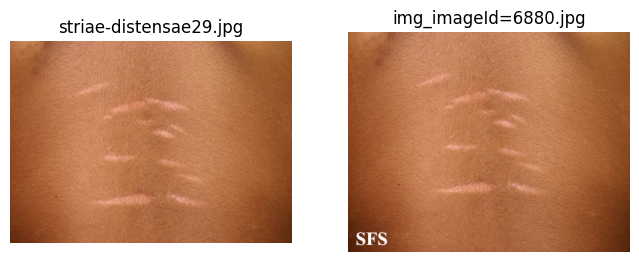

Similarity between img_imageId=6879.jpg and striae-distensae57.jpg: 0.07537639404709784


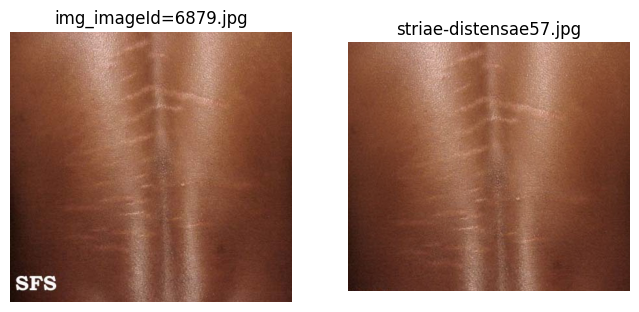

Similarity between img_imageId=6880.jpg and striae-distensae29.jpg: 0.05544117661980976


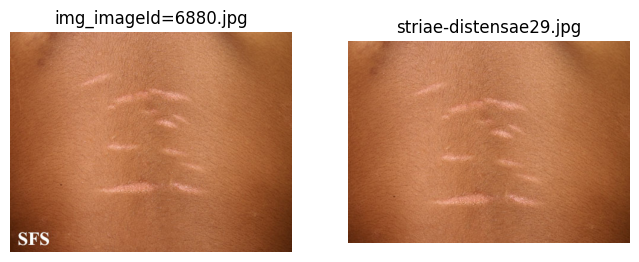

Similarity between striae-distensae57.jpg and img_imageId=6879.jpg: 0.13106939309889443


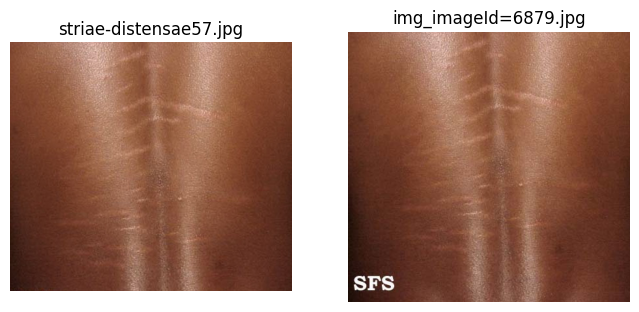

In [6]:
image_dir = "/Users/macbook/Documents/DL_Project/main_filepath/striae"
similar_images = find_similar_images(image_dir, threshold = 0.6)

display_similar_images(similar_images)

Similarity between img_imageId=1630.jpg and ehlers_danlos_syndrome76.jpg: 0.09466926200803177


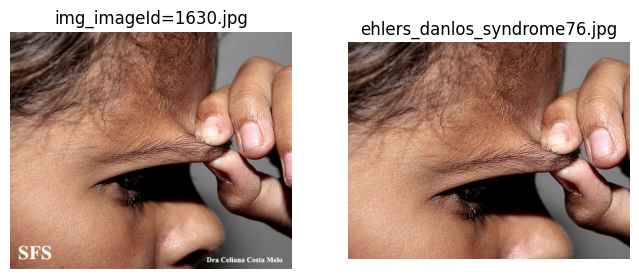

Similarity between img_imageId=1629.jpg and ehlers_danlos_syndrome39.jpg: 0.08217694688895977


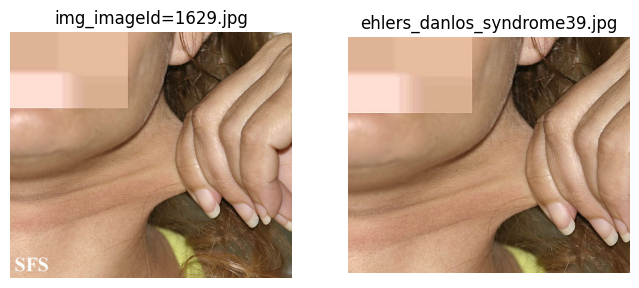

In [ ]:
image_dir = "/Users/macbook/Documents/DL_Project/main_filepath/ehlers danlos syndrome"
similar_images = find_similar_images(image_dir,threshold = 0.1)

display_similar_images(similar_images)

Labels where we get zeros 

Similarity between img_imageId=3134.jpg and langerhans-cell-histiocytosis26.jpg: 0.13657703366343735


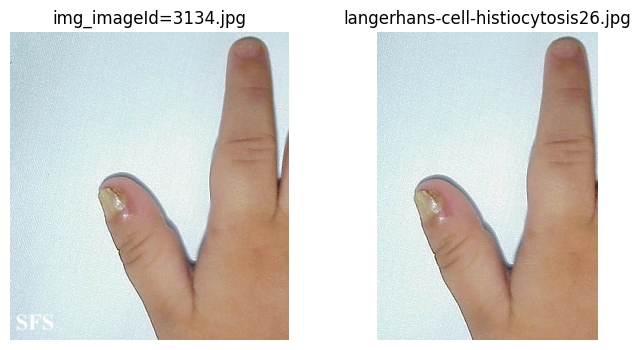

Similarity between langerhans-cell-histiocytosis37.jpg and img_imageId=3127.jpg: 0.10040848775598377


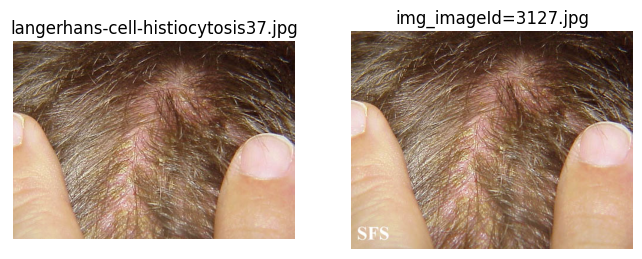

Similarity between langerhans-cell-histiocytosis36.jpg and img_imageId=3125.jpg: 0.2659091683462449


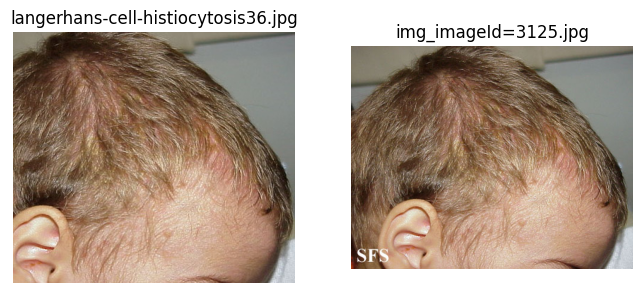

Similarity between langerhans-cell-histiocytosis34.jpg and img_imageId=3129.jpg: 0.07902026284387113


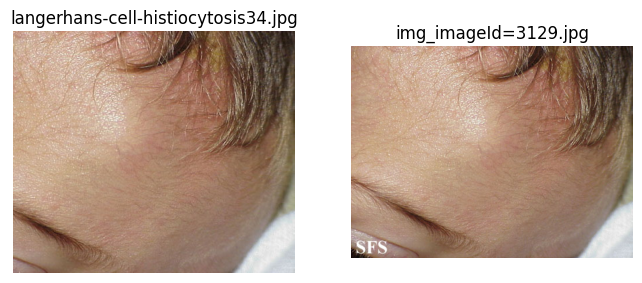

Similarity between langerhans-cell-histiocytosis35.jpg and img_imageId=3130.jpg: 0.2234605746208976


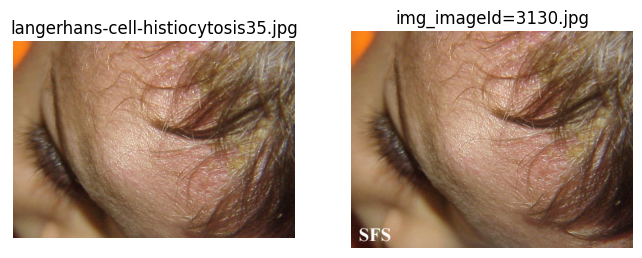

Similarity between img_imageId=3126.jpg and langerhans-cell-histiocytosis38.jpg: 0.04165000979334705


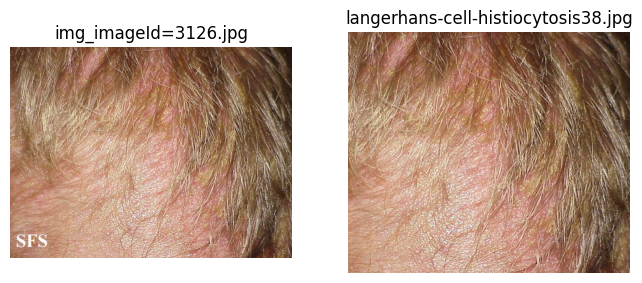

Similarity between img_imageId=3132.jpg and langerhans-cell-histiocytosis29.jpg: 0.042910667382313666


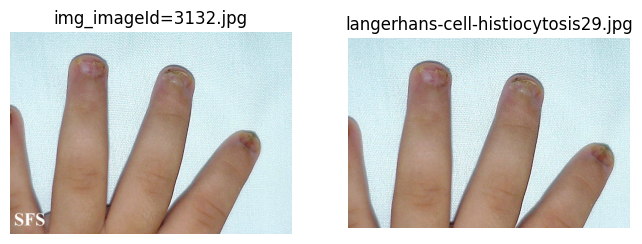

Similarity between langerhans-cell-histiocytosis30.jpg and img_imageId=3131.jpg: 0.18278677735908372


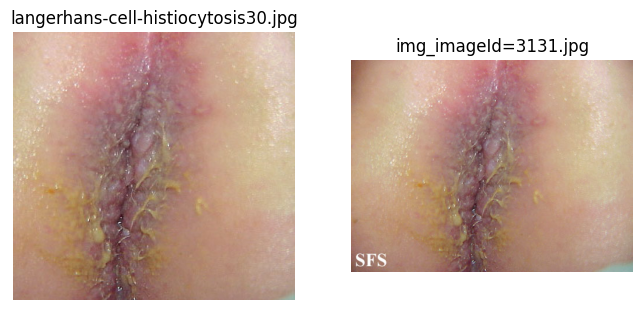

Similarity between img_imageId=3133.jpg and langerhans-cell-histiocytosis27.jpg: 0.05149210537157927


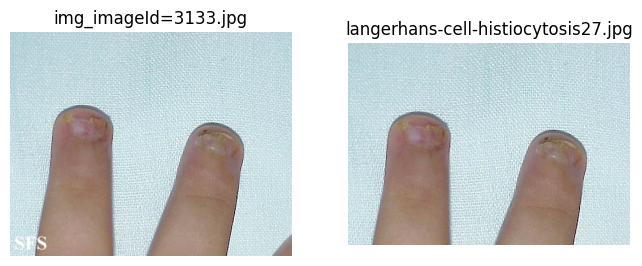

Similarity between img_imageId=3127.jpg and langerhans-cell-histiocytosis37.jpg: 0.07690989367341577


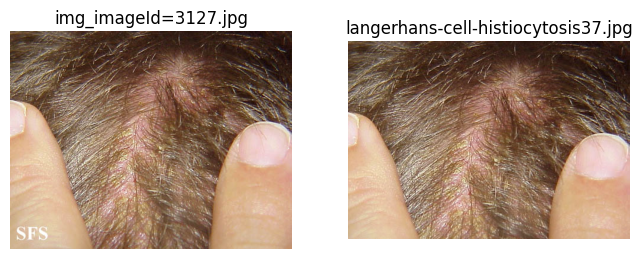

Similarity between img_imageId=3131.jpg and langerhans-cell-histiocytosis30.jpg: 0.13751217668551413


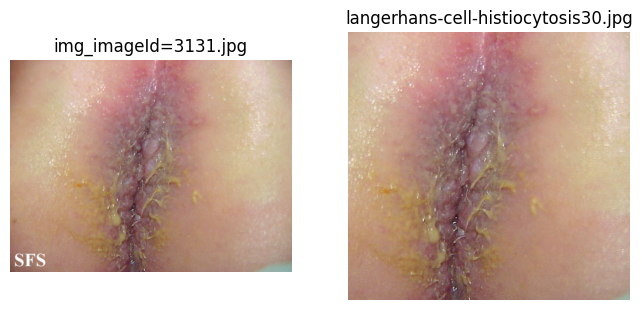

Similarity between img_imageId=3125.jpg and langerhans-cell-histiocytosis36.jpg: 0.16050956640786235


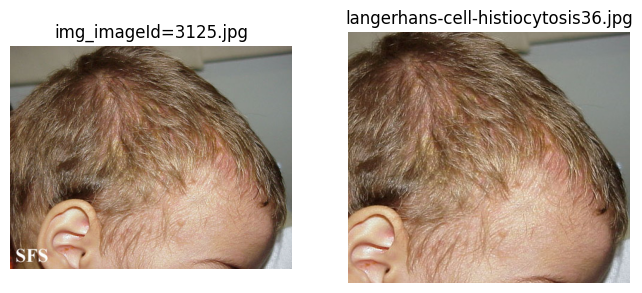

Similarity between langerhans-cell-histiocytosis26.jpg and img_imageId=3134.jpg: 0.3562894547018874


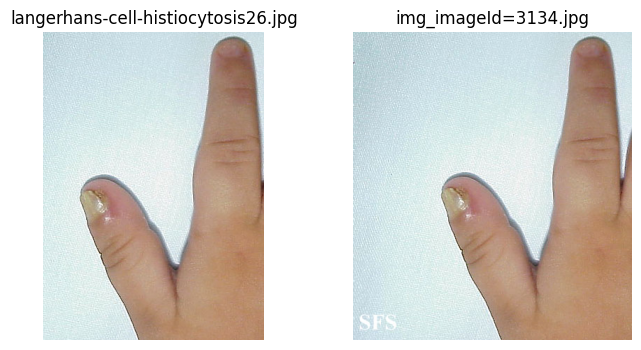

Similarity between langerhans-cell-histiocytosis27.jpg and img_imageId=3133.jpg: 0.09941032309192747


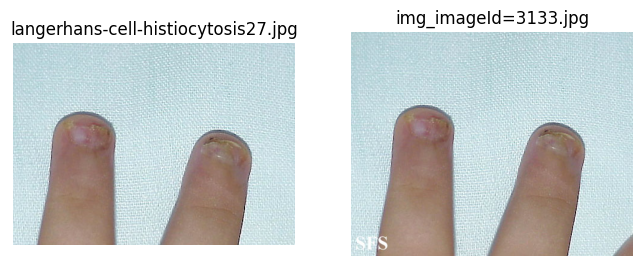

Similarity between img_imageId=3130.jpg and langerhans-cell-histiocytosis35.jpg: 0.04955287179206359


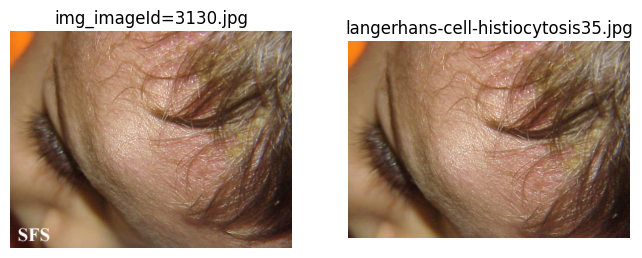

Similarity between img_imageId=3129.jpg and langerhans-cell-histiocytosis34.jpg: 0.0675504719617301


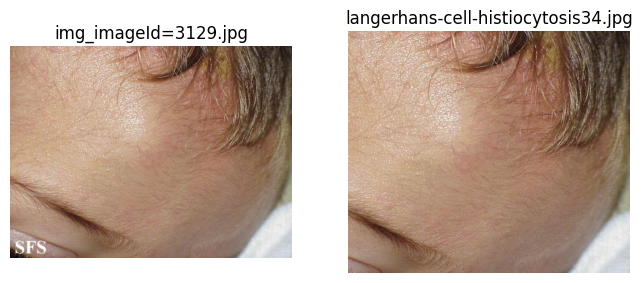

Similarity between img_imageId=3128.jpg and langerhans-cell-histiocytosis39.jpg: 0.02750607514938786


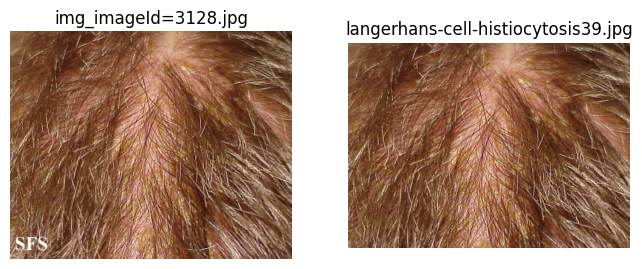

Similarity between langerhans-cell-histiocytosis29.jpg and img_imageId=3132.jpg: 0.05328136003814205


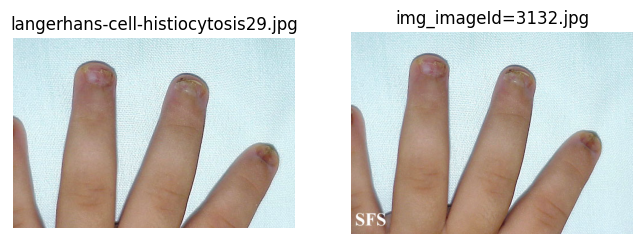

Similarity between langerhans-cell-histiocytosis38.jpg and img_imageId=3126.jpg: 0.05143300472773823


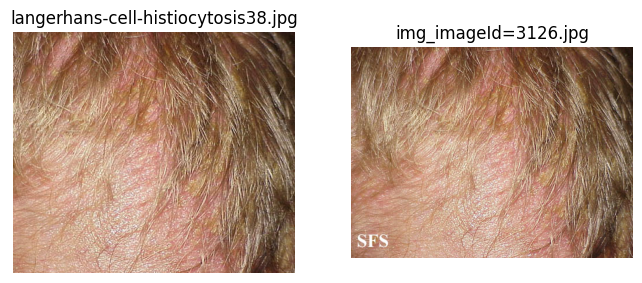

Similarity between langerhans-cell-histiocytosis39.jpg and img_imageId=3128.jpg: 0.031297717492968155


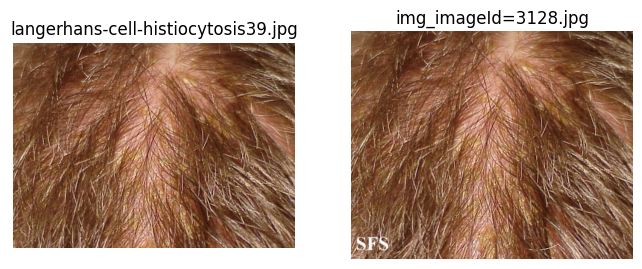

In [ ]:
# Example usage
image_dir = "/Users/macbook/Documents/DL_Project/main_filepath/langerhans cell histiocytosis"
similar_images = find_similar_images(image_dir, threshold = 0.9)

# Display similar image pairs
display_similar_images(similar_images)

In [ ]:
image_dir = "/Users/macbook/Documents/DL_Project/main_filepath/ichthyosis vulgaris"
similar_images = find_similar_images(image_dir,threshold = 0.9)
image_dir = "/Users/macbook/Documents/DL_Project/main_filepath/pustular psoriasis"
similar_images = find_similar_images(image_dir,threshold = 0.9)
image_dir = "/Users/macbook/Documents/DL_Project/main_filepath/sun damaged skin"
similar_images = find_similar_images(image_dir,threshold = 0.9)

No similar images found in the directory.
No similar images found in the directory.
No similar images found in the directory.


## Models with images transformed

install the right version of keras to be able to run model

In [ ]:
!pip install q keras==3.2.1

### Model with Clahe + Medium Blur Transformation

In [ ]:
!unzip "/content/drive/My Drive/Fac/DL2/output_training.zip" -d "/content"

In [ ]:
!unzip "/content/drive/My Drive/Fac/DL2/output_validation.zip" -d "/content"


In [ ]:
train_dir = '/content/output_training/'
val_dir = '/content/output_validation/'

In [ ]:
train_datagen = ImageDataGenerator (rescale=1./255)
val_datagen = ImageDataGenerator (rescale=1./255)
test_datagen = ImageDataGenerator (rescale=1./255)


train_generator = train_datagen.flow_from_directory(train_dir,
                                                    target_size=(290, 192),
                                                    batch_size=64,
                                                    class_mode= 'categorical'
                                                    )

validation_generator = val_datagen.flow_from_directory (val_dir,
                                                        target_size=(290, 192),
                                                         batch_size=64,
                                                         class_mode='categorical',
                                                         shuffle=False)


Found 12340 images belonging to 114 classes.
Found 2419 images belonging to 114 classes.


In [ ]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3,3), activation = 'relu', input_shape = (290, 192, 3), padding = 'same'))
model.add(layers.MaxPooling2D((2,2)))

model.add(layers.Conv2D(64, (3,3), activation = 'relu', input_shape = (290, 192, 3), padding = 'same'))
model.add(layers.MaxPooling2D((2,2)))

model.add(layers.Conv2D(128, (3,3), activation = 'relu', input_shape = (290, 192, 3), padding = 'same'))
model.add(layers.MaxPooling2D((2,2)))

model.add(Dropout(0.25))
model.add(layers.Conv2D(256, (3,3), activation = 'relu', input_shape = (290, 192, 3), padding = 'same'))
model.add(layers.MaxPooling2D((2,2)))

model.add(Dropout(0.3))
model.add(layers.Conv2D(512, (3,3), activation = 'relu', input_shape = (290, 192, 3), padding = 'same'))
model.add(layers.MaxPooling2D((2,2)))

model.add(Dropout(0.35))
model.add(layers.Conv2D(1024, (3,3), activation = 'relu', input_shape = (290, 192, 3), padding = 'same'))
model.add(layers.MaxPooling2D((2,2)))

model.add(Dropout(0.4))
model.add(layers.Conv2D(2048, (3,3), activation = 'relu', input_shape = (290, 192, 3), padding = 'same'))
model.add(layers.MaxPooling2D((2,2)))

model.add(layers.Flatten())
model.add(layers.Dense(512, activation = 'relu'))
model.add(Dropout(0.4))
model.add(layers.Dense(114, activation = 'softmax'))

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


In [ ]:
model.compile(loss='categorical_crossentropy',
              #optimizer=optimizers.RMSprop(learning_rate=1e-4),
              optimizer = optimizers.Adam(1e-4),
              metrics=['accuracy', F1Score(average='weighted', name = "f1_score")])

es = EarlyStopping(monitor='val_loss', mode='min', patience=2,  restore_best_weights=True)

In [ ]:
history = model.fit(
    train_generator,    epochs = 20,
    validation_data = validation_generator,
    verbose=1,
    callbacks=[es])

Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


193/193 ━━━━━━━━━━━━━━━━━━━━ 120s 439ms/step - accuracy: 0.0317 - f1_score: 0.0110 - loss: 4.6163 - val_accuracy: 0.0401 - val_f1_score: 0.0031 - val_loss: 4.6042
Epoch 2/20
193/193 ━━━━━━━━━━━━━━━━━━━━ 54s 273ms/step - accuracy: 0.0368 - f1_score: 0.0109 - loss: 4.5371 - val_accuracy: 0.0380 - val_f1_score: 0.0048 - val_loss: 4.5988
Epoch 3/20
193/193 ━━━━━━━━━━━━━━━━━━━━ 54s 272ms/step - accuracy: 0.0355 - f1_score: 0.0106 - loss: 4.5335 - val_accuracy: 0.0401 - val_f1_score: 0.0031 - val_loss: 4.5643
Epoch 4/20
193/193 ━━━━━━━━━━━━━━━━━━━━ 54s 272ms/step - accuracy: 0.0394 - f1_score: 0.0115 - loss: 4.5192 - val_accuracy: 0.0409 - val_f1_score: 0.0046 - val_loss: 4.5113
Epoch 5/20
193/193 ━━━━━━━━━━━━━━━━━━━━ 54s 272ms/step - accuracy: 0.0441 - f1_score: 0.0157 - loss: 4.4737 - val_accuracy: 0.0570 - val_f1_score: 0.0160 - val_loss: 4.4374
Epoch 6/20
193/193 ━━━━━━━━━━━━━━━━━━━━ 54s 272ms/step - accuracy: 0.0542 - f1_score: 0.0221 - loss: 4.4172 - val_accuracy: 0.0690 - val_f1_score

### Model with clahe transformation

In [ ]:
!unzip "/content/drive/My Drive/Fac/DL2/output_train_dir_C_B.zip" -d "/content"

In [ ]:
!unzip "/content/drive/My Drive/Fac/DL2/output_val_dir_C_B.zip" -d "/content"

In [ ]:
train_dir = '/content/output_train_dir/'
val_dir = '/content/output_val_dir/'

In [ ]:
train_datagen = ImageDataGenerator (rescale=1./255)
val_datagen = ImageDataGenerator (rescale=1./255)
test_datagen = ImageDataGenerator (rescale=1./255)


train_generator = train_datagen.flow_from_directory(train_dir,
                                                    target_size=(290, 192),
                                                    batch_size=64,
                                                    class_mode= 'categorical'
                                                    )

validation_generator = val_datagen.flow_from_directory (val_dir,
                                                        target_size=(290, 192),
                                                         batch_size=64,
                                                         class_mode='categorical',
                                                         shuffle=False)


Found 12337 images belonging to 114 classes.
Found 2421 images belonging to 114 classes.


In [ ]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3,3), activation = 'relu', input_shape = (290, 192, 3), padding = 'same'))
model.add(layers.MaxPooling2D((2,2)))

model.add(layers.Conv2D(64, (3,3), activation = 'relu', input_shape = (290, 192, 3), padding = 'same'))
model.add(layers.MaxPooling2D((2,2)))

model.add(layers.Conv2D(128, (3,3), activation = 'relu', input_shape = (290, 192, 3), padding = 'same'))
model.add(layers.MaxPooling2D((2,2)))

model.add(Dropout(0.25))
model.add(layers.Conv2D(256, (3,3), activation = 'relu', input_shape = (290, 192, 3), padding = 'same'))
model.add(layers.MaxPooling2D((2,2)))

model.add(Dropout(0.3))
model.add(layers.Conv2D(512, (3,3), activation = 'relu', input_shape = (290, 192, 3), padding = 'same'))
model.add(layers.MaxPooling2D((2,2)))

model.add(Dropout(0.35))
model.add(layers.Conv2D(1024, (3,3), activation = 'relu', input_shape = (290, 192, 3), padding = 'same'))
model.add(layers.MaxPooling2D((2,2)))

model.add(Dropout(0.4))
model.add(layers.Conv2D(2048, (3,3), activation = 'relu', input_shape = (290, 192, 3), padding = 'same'))
model.add(layers.MaxPooling2D((2,2)))

model.add(layers.Flatten())
model.add(layers.Dense(512, activation = 'relu'))
model.add(Dropout(0.4))
model.add(layers.Dense(114, activation = 'softmax'))

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


In [ ]:
from tensorflow.keras import optimizers
from tensorflow.keras.metrics import F1Score
from tensorflow.keras.callbacks import EarlyStopping

model.compile(loss='categorical_crossentropy',
              #optimizer=optimizers.RMSprop(learning_rate=1e-4),
              optimizer = optimizers.Adam(1e-4),
              metrics=['accuracy', F1Score(average='weighted', name = "f1_score")])

es = EarlyStopping(monitor='val_loss', mode='min', patience=2,  restore_best_weights=True)

In [ ]:
history = model.fit(
    train_generator,    epochs = 20,
    validation_data = validation_generator,
    verbose=1,
    callbacks=[es])

Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


193/193 ━━━━━━━━━━━━━━━━━━━━ 90s 407ms/step - accuracy: 0.0327 - f1_score: 0.0083 - loss: 4.6336 - val_accuracy: 0.0359 - val_f1_score: 0.0025 - val_loss: 4.6226
Epoch 2/20
193/193 ━━━━━━━━━━━━━━━━━━━━ 48s 239ms/step - accuracy: 0.0351 - f1_score: 0.0092 - loss: 4.5464 - val_accuracy: 0.0401 - val_f1_score: 0.0031 - val_loss: 4.5572
Epoch 3/20
193/193 ━━━━━━━━━━━━━━━━━━━━ 48s 240ms/step - accuracy: 0.0420 - f1_score: 0.0117 - loss: 4.5321 - val_accuracy: 0.0401 - val_f1_score: 0.0031 - val_loss: 4.5067
Epoch 4/20
193/193 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - accuracy: 0.0361 - f1_score: 0.0087 - loss: 4.5257 - val_accuracy: 0.0401 - val_f1_score: 0.0031 - val_loss: 4.5173
Epoch 5/20
193/193 ━━━━━━━━━━━━━━━━━━━━ 47s 237ms/step - accuracy: 0.0350 - f1_score: 0.0075 - loss: 4.5116 - val_accuracy: 0.0413 - val_f1_score: 0.0059 - val_loss: 4.5098
